In [1]:
# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import cv2
import pickle

import matplotlib.pyplot as plt
%matplotlib inline

###########################################################

import keras.optimizers as optimizers
from keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint, TensorBoard
import keras.backend as K

###########################################################

from ssd.generator import Generator
from ssd.data_augmenter import DataAugmenter
from ssd.bbox_codec import BBoxCodec
from ssd.losses import SsdLoss
import ssd.ssd300_vgg16 as ssd300_vgg16
from ssd.detection import Detection
from ssd.metrics import PascalVocEval

import ssd.imaging as imaging
import ssd.tools as tools
import ssd.data as data

Using TensorFlow backend.


In [3]:
################################################################################

# Load prepared VOC data

trainval_gtb_files = ['data/pascal_voc_2012_trainval.p', 'data/pascal_voc_2007_trainval.p']
test_gtb_files = ['data/pascal_voc_2007_test.p']

trainval_voc_2012_dir = '../datasets/voc/VOCtrainval_11-May-2012/'
trainval_voc_2007_dir = '../datasets/voc/VOCtrainval_06-Nov-2007/'
test_voc_2007_dir = '../datasets/voc/VOCtest_06-Nov-2007/'

trainval_samples_files = [trainval_voc_2012_dir + 'ImageSets/Main/trainval.txt', trainval_voc_2007_dir + 'ImageSets/Main/trainval.txt']
test_samples_files = [test_voc_2007_dir + 'ImageSets/Main/test.txt']

trainval_img_dirs = [trainval_voc_2012_dir + 'JPEGImages/', trainval_voc_2007_dir + 'JPEGImages/']
test_img_dirs = [test_voc_2007_dir + 'JPEGImages/']

voc_data = data.PascalVocData(trainval_gtb_files, test_gtb_files,
                              trainval_samples_files, test_samples_files,
                              trainval_img_dirs, test_img_dirs,
                              val_size=0.2)

trainval_gtb = voc_data.get_trainval_gtb()
test_gtb = voc_data.get_test_gtb()

trainval_img_registry = voc_data.get_trainval_img_registry()
test_img_registry = voc_data.get_test_img_registry()

train_samples, valid_samples = voc_data.get_trainval_samples()
test_samples = voc_data.get_test_samples()

print('Train size: {0}'.format(len(train_samples)))
print('Valid size: {0}'.format(len(valid_samples)))
print('Test size: {0}'.format(len(test_samples)))

################################################################################

# input config
target_img_size = (300, 300)
target_img_w, target_img_h = target_img_size
num_classes = 21

# loss config
hard_neg_pos_ratio = 3

# bbox codec config
iou_threshold = 0.5
encode_variances = True
match_per_prediction = True

# model config
use_bn=True
use_dropout=True

# train process config
batch_size=16
nb_epoch = 100#50
early_stopping_patience=5

################################################################################

# calc # of samples per epoch
nb_samples_per_epoch = len(train_samples)
nb_valid_samples = len(valid_samples)

nb_steps_per_epoch = max(int(nb_samples_per_epoch/batch_size), 1)
nb_valid_steps_per_epoch = max(int(nb_valid_samples/batch_size), 1)

print('nb_steps_per_epoch: {0}'.format(nb_steps_per_epoch))
print('nb_valid_steps_per_epoch: {0}'.format(nb_valid_steps_per_epoch))

################################################################################

# Prepare Generator
feature_layers_config, prior_boxes = ssd300_vgg16.gen_vgg16_feature_layers_config(target_img_w, target_img_h)
bbox_codec = BBoxCodec(prior_boxes, num_classes, iou_threshold=iou_threshold, 
                       encode_variances=encode_variances, match_per_prediction=match_per_prediction)

gen = Generator(trainval_gtb, trainval_img_registry, target_img_size, DataAugmenter(), bbox_codec)

# compile and train the model using the generator function
train_generator = gen.flow(train_samples, batch_size=batch_size, do_augment=True)
valid_generator = gen.flow(valid_samples, batch_size=batch_size, do_augment=True)


Train size: 13240
Valid size: 3311
Test size: 4952
nb_steps_per_epoch: 827
nb_valid_steps_per_epoch: 206


# Training

In [4]:
################################################################################

def lr_schedule(epoch):
    if epoch < 40:
        return 1e-3
    elif epoch < 80:
        return 1e-4
    return 1e-5

################################################################################

# general callbacks
lr_scheduler = LearningRateScheduler(lr_schedule)
tensor_board = TensorBoard(log_dir='./tb-logs', write_graph=True, write_images=True)
                           #histogram_freq=1,
                           #,embeddings_freq=1)

In [ ]:
# Destroys the current TF graph and creates a new one.
# Useful to avoid clutter from old models / layers.
K.clear_session()

# freeze none layers
model = ssd300_vgg16.SSD300(feature_layers_config, freeze_layers=[], use_bn=use_bn, use_dropout=use_dropout)
#model.summary()

optimizer=optimizers.Adam(lr=1e-4)
#optimizer=optimizers.SGD(lr=0.001, momentum=0.9, decay=0.0, nesterov=False)
model.compile(optimizer=optimizer, loss=SsdLoss(num_classes=num_classes, hard_neg_pos_ratio=hard_neg_pos_ratio).loss)

model_save_path='models/model.h5'
checkpoint = ModelCheckpoint(model_save_path, monitor='val_loss', verbose=1, save_best_only=True,
                             save_weights_only=False, mode='auto')
early_stopping = EarlyStopping(monitor='val_loss', patience=early_stopping_patience, verbose=1, mode='auto')

history = model.fit_generator(train_generator, steps_per_epoch=nb_steps_per_epoch,
                              validation_data=valid_generator, validation_steps=nb_valid_steps_per_epoch,
                              #callbacks=[lr_scheduler, checkpoint, early_stopping, tensor_board],
                              #callbacks=[lr_scheduler, checkpoint, early_stopping],  
                              callbacks=[checkpoint, early_stopping],
                              epochs=nb_epoch,
                              )

model.save('models/model.last.h5')

#tools.plot_loss(history, out_file="./loss-curve.png")

Epoch 1/100
827/827 [==============================] - 1848s - loss: 144.4390 - val_loss: 165.2567
Epoch 2/100
827/827 [==============================] - 1801s - loss: 127.0427 - val_loss: 141.3618
Epoch 3/100
827/827 [==============================] - 1803s - loss: 118.4901 - val_loss: 123.4153
Epoch 4/100
827/827 [==============================] - 1800s - loss: 111.7991 - val_loss: 117.6300
Epoch 5/100
827/827 [==============================] - 1797s - loss: 105.7442 - val_loss: 112.7090
Epoch 6/100
827/827 [==============================] - 1796s - loss: 101.0703 - val_loss: 108.2961
Epoch 7/100
827/827 [==============================] - 1792s - loss: 96.6708 - val_loss: 103.3005
Epoch 8/100
827/827 [==============================] - 1798s - loss: 93.4654 - val_loss: 102.1788
Epoch 9/100
827/827 [==============================] - 1795s - loss: 89.8097 - val_loss: 96.8754
Epoch 10/100
827/827 [==============================] - 1792s - loss: 86.6912 - val_loss: 93.2640
Epoch 11/100
82

827/827 [==============================] - 1786s - loss: 53.0684 - val_loss: 62.5525
Epoch 33/100
827/827 [==============================] - 1800s - loss: 52.7685 - val_loss: 61.8655
Epoch 34/100
827/827 [==============================] - 1791s - loss: 51.9699 - val_loss: 61.7864
Epoch 35/100
827/827 [==============================] - 1792s - loss: 51.5990 - val_loss: 62.0353
Epoch 36/100
827/827 [==============================] - 1790s - loss: 50.8370 - val_loss: 60.9134
Epoch 37/100
827/827 [==============================] - 1792s - loss: 50.5278 - val_loss: 60.1724
Epoch 38/100
827/827 [==============================] - 1786s - loss: 50.0452 - val_loss: 60.4271
Epoch 39/100
827/827 [==============================] - 1791s - loss: 49.6458 - val_loss: 60.3523
Epoch 40/100
827/827 [==============================] - 1794s - loss: 49.0781 - val_loss: 59.5304
Epoch 41/100
827/827 [==============================] - 1790s - loss: 48.9318 - val_loss: 59.9308
Epoch 42/100
242/827 [=======>...

![title](loss-curve.png)

## Evaluate

In [5]:
# Destroys the current TF graph and creates a new one.
# Useful to avoid clutter from old models / layers.
K.clear_session()

################################################################

#best_model = ssd300_vgg16.SSD300(feature_layers_config, use_bn=use_bn, use_dropout=use_dropout)
#best_model.load_weights('models/model.h5')
best_model = tools.load_ssd_model('models/model.h5', num_classes, hard_neg_pos_ratio)


In [6]:
detector = Detection(num_classes, target_img_size, bbox_codec, 
                     #out_nms_top_k=400, out_nms_threshold=0.45, out_conf_threshold=0.5)
                     out_nms_top_k=400, out_nms_threshold=1/3.0, out_conf_threshold=0.5)

voc_eval = PascalVocEval(test_gtb, test_img_registry)

def print_eval(model):
    recalls, precisions, aps = voc_eval.eval(model, detector, test_samples, return_per_class=True)
    print('mAP: {0:.2f}'.format(np.mean(aps)))
    for c, rec, prec, ap in zip(data.PascalVocData.CLASSES[1:], recalls, precisions, aps):
        print('{0:12} {1:.2f}'.format(c, ap))

In [7]:
print_eval(best_model)# out_nms_top_k=400, out_nms_threshold=1/3.0

mAP: 0.66
aeroplane    0.76
bicycle      0.76
bird         0.66
boat         0.63
bottle       0.39
bus          0.71
car          0.80
cat          0.80
chair        0.36
cow          0.59
diningtable  0.64
dog          0.70
horse        0.75
motorbike    0.72
person       0.70
pottedplant  0.44
sheep        0.56
sofa         0.71
train        0.76
tvmonitor    0.68


## Test

In [8]:
# Prepare test images

test_img_dir = test_img_dirs[0]#test_voc_2007_dir + 'JPEGImages/'

test_files = [
    '003160.jpg', '000640.jpg',
    '003682.jpg', '003131.jpg',
    '003431.jpg', '003475.jpg',
    '000004.jpg', '003504.jpg',
    '003502.jpg', '001716.jpg',
    '003761.jpg', '003533.jpg',
    '000434.jpg', '003538.jpg',
    '003542.jpg', '000149.jpg',
    '000574.jpg', '003544.jpg', 
    '000100.jpg', '003686.jpg',
]

test_images = []
for test_file in test_files:
    test_images.append(imaging.load_img(test_img_dir + test_file))


### Show GTBs of test images

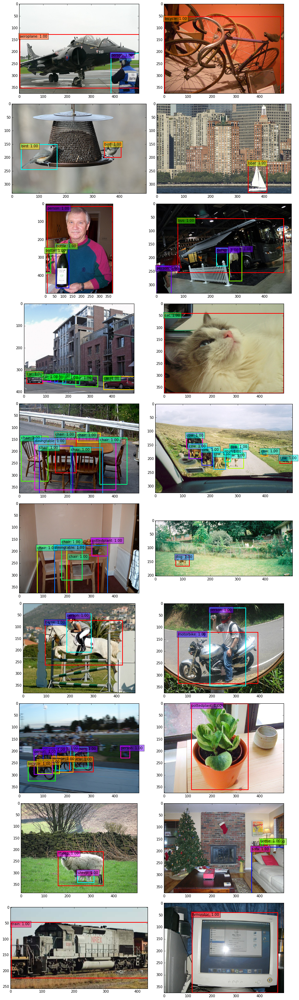

In [9]:
tools.show_gtbs(test_img_dir, test_files, test_gtb, num_classes, cols=2, figsize=(12, 4), font_size=10)

### Show all predictions with conf higher than 0.5

In [10]:
def show_predictions(model):
    orig_images, x, y_pred = tools.make_prediction(model, target_img_size, test_img_dir, test_files)
    y_pred_bbox = [] 
    y_pred_decoded = []
    for y in y_pred:
        bbox = bbox_codec.decode(y)
        y_pred_bbox.append(bbox)
        y_pred_decoded.append(np.concatenate((bbox, y[:, 4:]), axis=1))

    y_pred_decoded = np.array(y_pred_decoded)

    images = []
    for img in x:#orig_images:
        images.append(imaging.denormalize_img(img))

    tools.show_predictions(orig_images, y_pred_decoded, num_classes, conf_threshold=0.5, cols=2, figsize=(12,4), font_size=10)

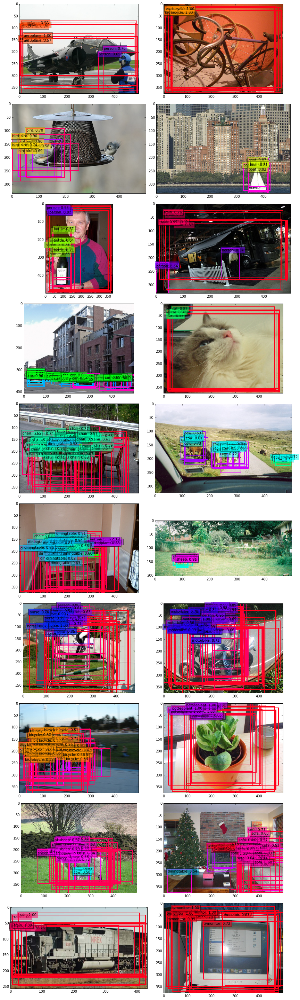

In [11]:
show_predictions(best_model)

### Apply NMS

In [12]:
# Make predictions with NMS
detector = Detection(num_classes, target_img_size, bbox_codec, 
                     out_nms_top_k=400, out_nms_threshold=1/3.0, out_conf_threshold=0.5)

imgs, predictions = detector.detect_bboxes(best_model, test_images)

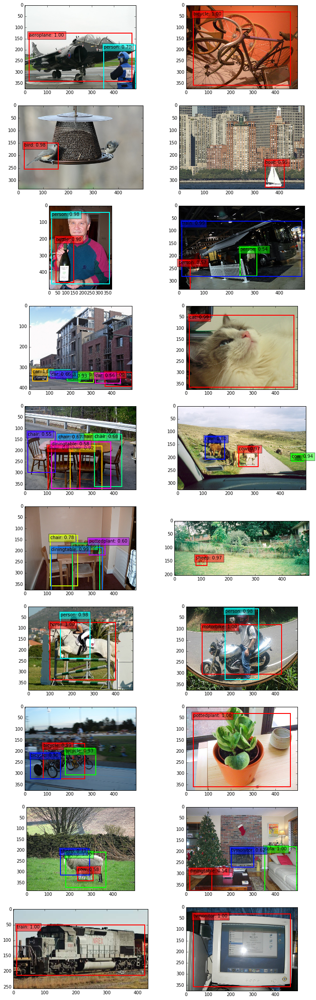

In [13]:
tools.show_detections(imgs, predictions, 2, figsize=(12, 4), font_size=10)

### Check matching GTBs to PriorBoxes

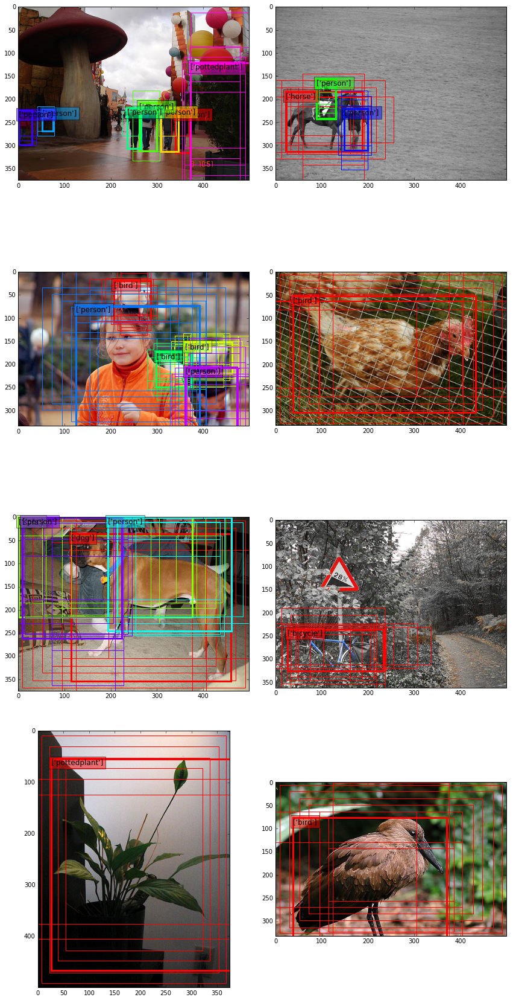

In [18]:
# Bold boxes are GTBs
# Thin boxes are matched PriorBoxes

test_generator = gen.flow(train_samples, batch_size=8, do_augment=False, return_debug_info=True)
x, y, orig_x, orig_y, matches = next(test_generator)
tools.show_matches(orig_x, orig_y, matches, prior_boxes, cols=2, figsize=(12,6))